# Homework 4 Part 1

This is an individual assignment.

---

# Problem 1 (5 points)

**What are the most common challenges when training artificial neural networks? Name at least 4. Provide a list of at least 2 strategies that can mitigate each one of the challenges. Justify your answers.**

The main challenges and associated strategies to mitigate them are as follows:

1. **Vanishing gradient problem**. You would be faced with the tricky vanishing gradients problem (or the related exploding gradients problem) that affects deep neural networks and makes lower layers very hard to train. 

    1. **Mitigating solutions:** Weight initialization (He, Glorot and LeCun initialization), use of non-saturating activation function (e.g. ReLU or its variants), batch normalization or gradient clipping.

2. **Not enough training data**. You might not have enough training data for such a large network, or it might be too costly to label. 

    1. **Mitigating solutions:** transfer learning.

3. **Training is too slow**. Training may be extremely slow. 

    1. **Mitigating solutions:** accelerated learning with momentum, accelerated learning and adaptive learning rate with Adam and learning rate scheduler (e.g. power scheduler).

4. **Model has millions of parameters causing a severe risk of overfitting**. A model with millions of parameters would severely risk overfitting the training set, especially if there are not enough training instances, or they are too noisy.

    1. **Mitigating solutions:** regularizer (e.g. L1 or L2), dropout, early stopping criteria.

---

# Problem 2 (5 points)

**Consider the linear activation function**

$$\phi(x) = x$$

**and the hard-limit activation function**

$$\phi(x) = \begin{cases}0 & x\leq 0 \\ 1 & x>0\end{cases}$$

**Which of the following functions can be exactly represented by a neural network with one hidden layer which uses linear and/or hard-limit activation functions? For each case, justify your answer.**

**Case 1: polynomials of degree one.**

**Case 2: hinge loss of the form $h(x)=\max(1-x,0)$.**

**Case 3: polynomials of degree two.**

**Case 4: piecewise constant functions.**

Case1: Yes, it can be represented with both linear and step activation functions because the first hidden layer can represent lines

Case 2: Yes, both can represent hingle loss, because the hinge loss is made of 2 lines which are continious at 0: 1-x=0 and x=0. Hinge loss can not be represented by a single line so neural network with one linear activation function is not enough.

Case 3: No, degree 2 polynomials cannot be represented by these activation functions as we need to multiply the inputs.

Case 4: Yes, both linear and step activation can represent piecewise constant functions because piecewise contant function 

---

# Problem 3 (5 points)

**What does momentum assist with in training artificial neural networks? What may happen if you set the momentum hyperparameter too close to 1 (e.g., 0.99999) when using an SGD optimizer?**

Momentum assists with speed of learning. In a neural network, the learning rate parameter needs to be crucially defined to ensure stability and convergence. Too large of learning rate will cause instability and sometimes diverge. Too small learning rate will cause stability but it will take too long to converge. A momentum term can be added to delta correction rule of each weight connection without the need of increasing the learning rate.

If you set the momentum hyperparameter too close to 1 (e.g., 0.99999) when using an SGD (Stochastic Gradient Descent) optimizer, then the algorithm will likely pick up a lot of speed, hopefully moving roughly toward the global minimum, but its momentum will carry it right past the minimum. Then it will slow down and come back, accelerate again, overshoot again, and so on. It may oscillate this way many times before converging, so overall it will take much longer to converge than with a smaller momentum value.

---

# Problem 4 (5 points)

**What is the difference between standard momentum and the Nesterov's formula for the momentum?**

The difference between regular momentum and Nesterov's momentum is the location in which the gradient is computed.

A reminder that the weight update rule is defined as:

\begin{align*}
w^{(t+1)} = w^{(t)} + \Delta w^{(t)}
\end{align*}

where the delta correction rule is defined as:

\begin{align*}
\Delta w^{(t)} = -\eta \nabla J(w^{(t)})
\end{align*}

For **standard momentum**, the delta correction rule is defined as:

\begin{align*}
\Delta w^{(t)} = -\eta \nabla J(w^{(t)}) + \alpha \Delta w^{(t-1)}
\end{align*}

where $\alpha$ is typically set to 0.9. At the current location for the coefficients $w^{(t)}$, we first compute the gradient and then add a scaled version of the previous delta correction rule (which will increase speed if they have the same sign, or *cancel* with current gradient if they have a different sign, i.e., the gradients are pointing in different directions).

In the **Nesterov's momentum formula**, the delta correction rule is defined as:

\begin{align*}
\Delta w^{(t)} &= -\eta \nabla J(m^{(t)})\\
m^{(t)} &= w^{(t)} + \alpha \Delta w^{(t-1)}
\end{align*}

where $\alpha$ is typically set to 0.9. With the Nesterov's formula, we first add the scaled version of the previous correction rule, and then at that location ($m^{(t)} = w^{(t)} + \alpha \Delta w^{(t-1)}$), we compute the gradient.

---

# Problem 5 (5 points)

**Use the figure below and the chain rule of derivatives to show how the weights $w_i$ can be updated using the gradient of any smooth non-negative cost function $J(\mathbf{w})$.**

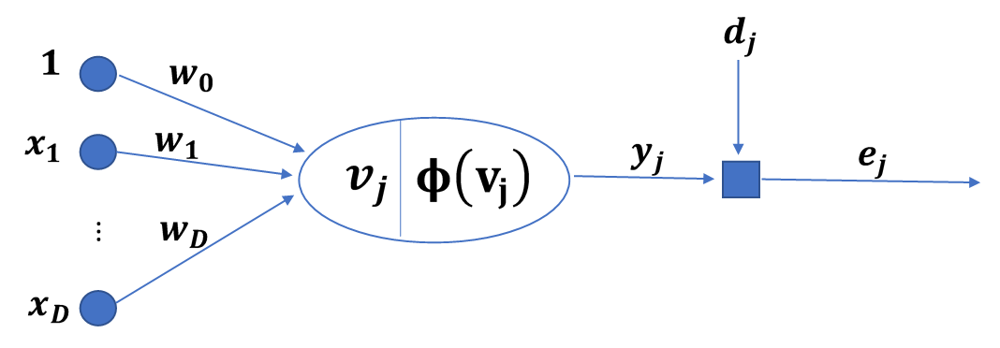

In [1]:
from IPython.display import Image
Image('figures/Chain Rule.png',width=800)

**What is the difficulty in training the hidden layer weights in MLP networks?**

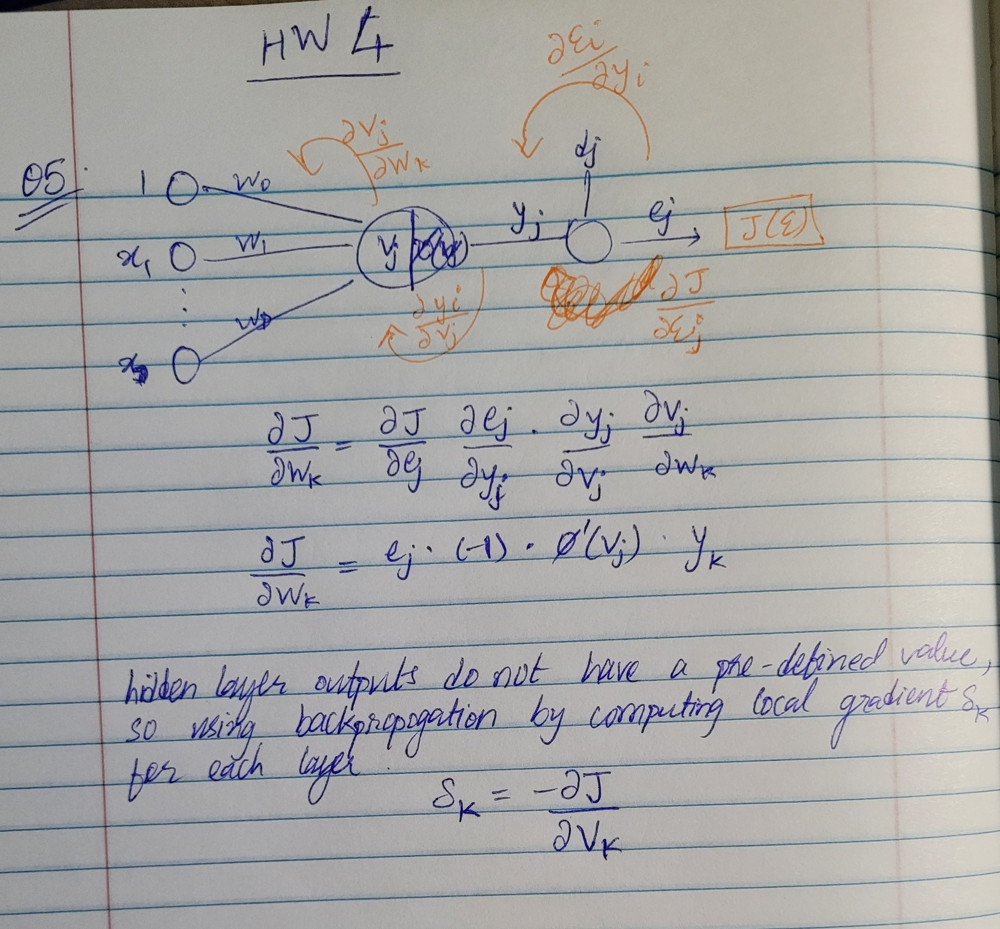

---

# Problem 6 (5 points)

**Consider the following learning curves obtained by training a Multi-Layer Perceptron (MLP) using mini-batch, batch and online learning. Which learning curve corresponds to each type of learning? Justify your answer.**

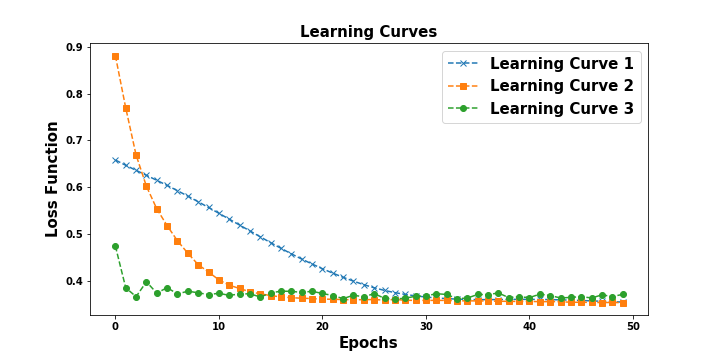

In [2]:
Image('figures/LearningCurves.png',width=600)

Curve 3 is due to online learning because the initial learning epochs converge quickly but it becomes unstable as the learning rate becomes too large to reach the local minima

Curve 1 is showing the batch learning because batch learning updates based on the average response from all data samples. Therefore, it is expected to converge slower but stable.

Curve 2 must represent mini-batch because learning is slightly slower than online but faster than batch learning. Also, the performance is much more stable than online.

---

# Problem 7 (5 points)

**From the statements below, select all that are true:**

1. **It is OK to initialize all the weights to the same value as long as that value is selected randomly using He initialization.**

2. **In CNNs, pooling layers reduce the spatial resolution of the image.**

3. **In order to carry convolution operations, CNNs have more weights connections than standard MLPs.** 

4. **In CNNs, the filters in earlier layers tend to include low-level features such as edge detectors.**

1. False. If the weights are initialized to the same value this will bring the network to a state of symmetry and all the weights will have the same gradient value becoming unable to learn.

2. True

3. False. CNNs have fewer parameters than standard fully-connected MLPs.

4. True

---

# Problem 8 (5 points)

**Consider a multi-class (10 labels) classification problem. Suppose you are training a Multi-Layer Perceptron (MLP) with 2 dense hidden layers. How many units and what activation function should you consider for the output layer? Discuss the cases where you use 1 unit vs 10 units.**

We can use either 1 or 10 units but there are restrictions regarding the activation function in order to successfully train the network on this multi-class classification task.

* If we use 1 unit, then the output layer will have to predict categorical labels (1, 2, ..., 9, 10). First off, this has clear disadvantages since it induces an implicit rank of labels (1<2<...<9<10). When training with MSE, we are strictly trying to minimize the error. So, even if the network is confusing class 0 with class 9 (they might share a lot of learned features), the network might output a class label closer to 9 in order to minimize the error (objective function). This is not desirable since we loose this information while interpreting the results and making design choices for the architecture. Moreover, in order for the output layer to predict a categorical label, we cannot use sigmoid or tanh activation functions since their output is bounded between [0,1] and [-1,1], respectively. Alternative activation functions for a single-unit output layer include: linear, ReLU and Leaky ReLU.

* If we use 10 units in the output layer, we must use one-hot encoding of the class label, that is, label 1 is now mapped to $I_1=[1,0,0,...0]$. More generally, class label $i$ will be mapped to the $i$-th row (or column) of a $10\times 10$ identity matrix, $I_i$. If we use a bounded activation functions (such as sigmoid or tanh), the output predictions for all 10 classes will be continuous values, e.g. $[0.5,0.7,0.3,0.01,0.9,...]$. For ReLU or its variants, the outputs may be much larger than 1. In order to induce a probability to these predictions, we should use the softmax activation function which will transform each unit in the output layer $y_i$ as $\frac{e^{y_i}}{\sum_j e^{y_j}}$. The outputs will now sum to 1. In order to make a prediction we take the ```argmax``` entry.

---

# Problem 9 (7.5 points)

**Consider the following network: 1 input layer, 1 hidden layer and 1 output layer.**

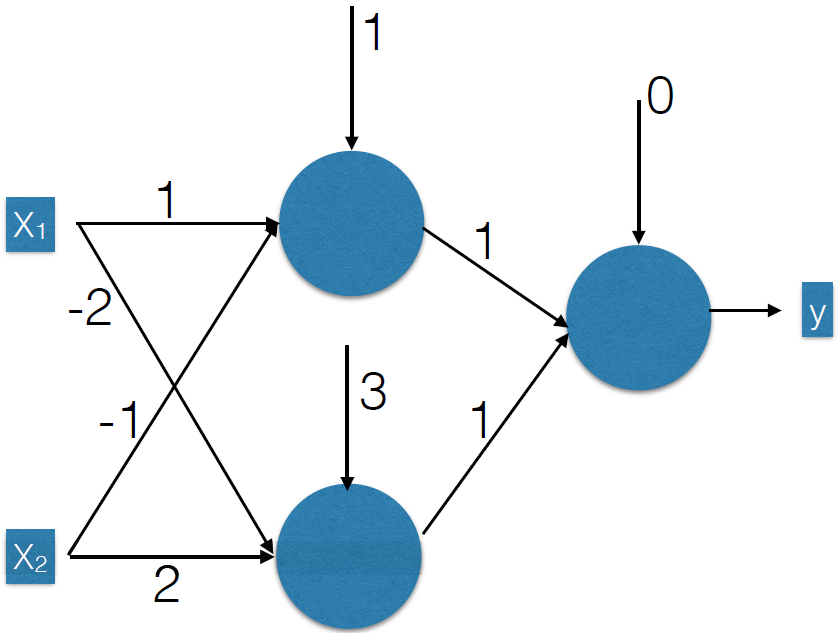

In [3]:
Image('figures/MLP.png', width=400)

**All weights are initialized to the values shown. Consider the data point $x=[0,2]^T$ with desired output vector $t=1$. Complete one iteration of backpropagation by hand assuming a learning rate of $\eta=0.01$.**

**What would all the weight values be after one backpropagation iteration? Show your work.**

**Use the linear activation function: $\phi(x) = x$. Note that $\frac{d\phi(x)}{dx}=\phi'(x) = 1$.**

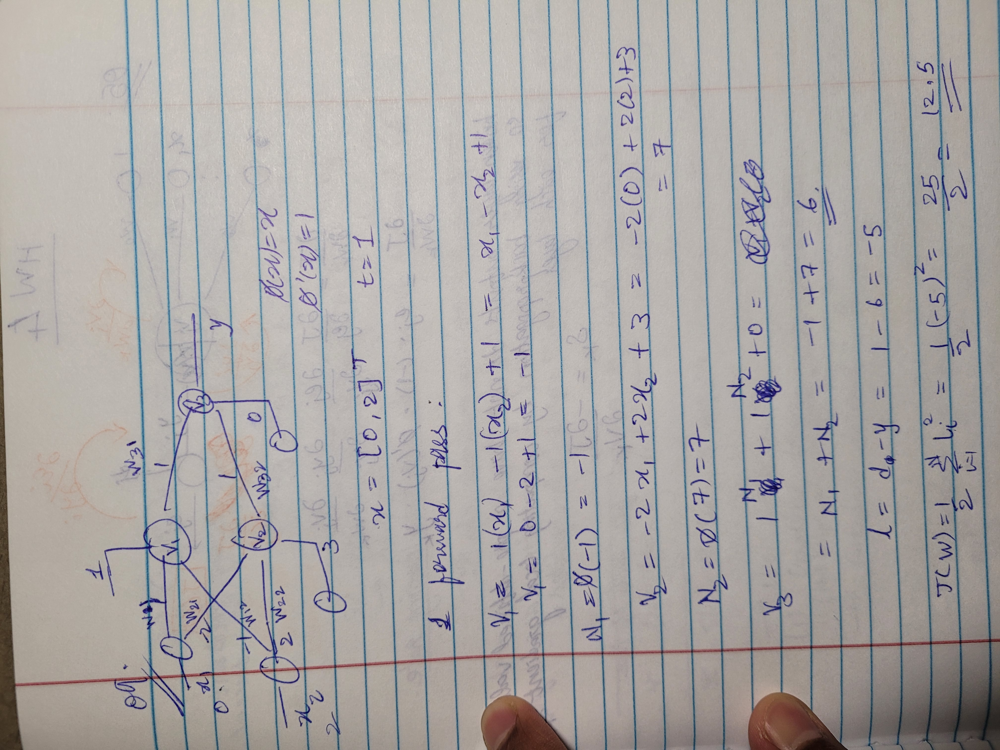

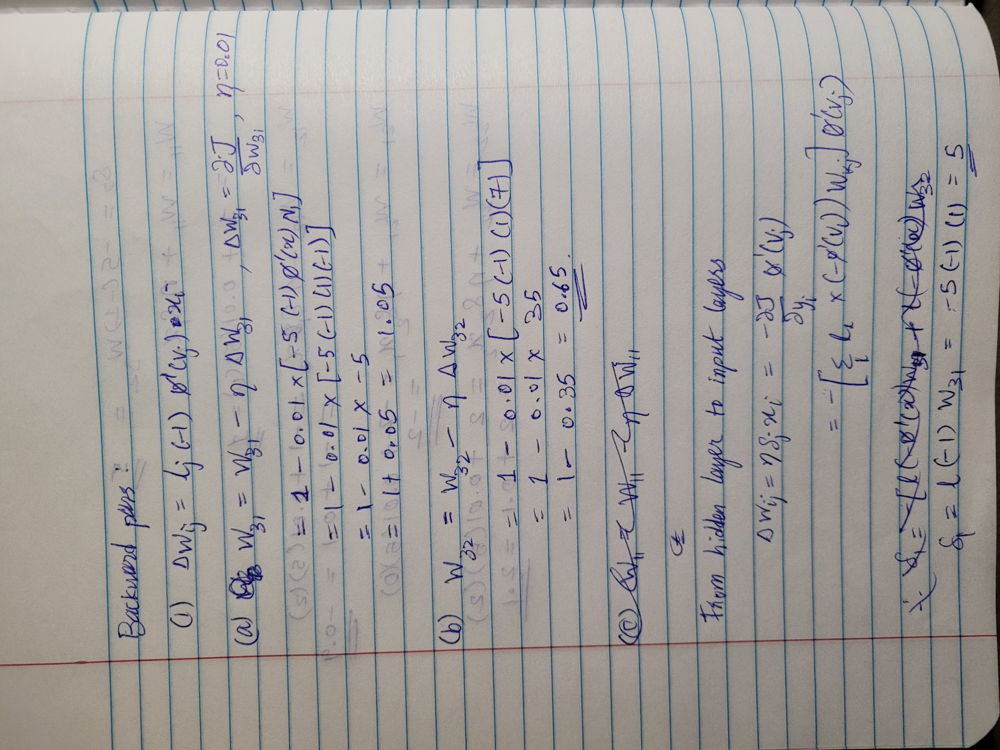

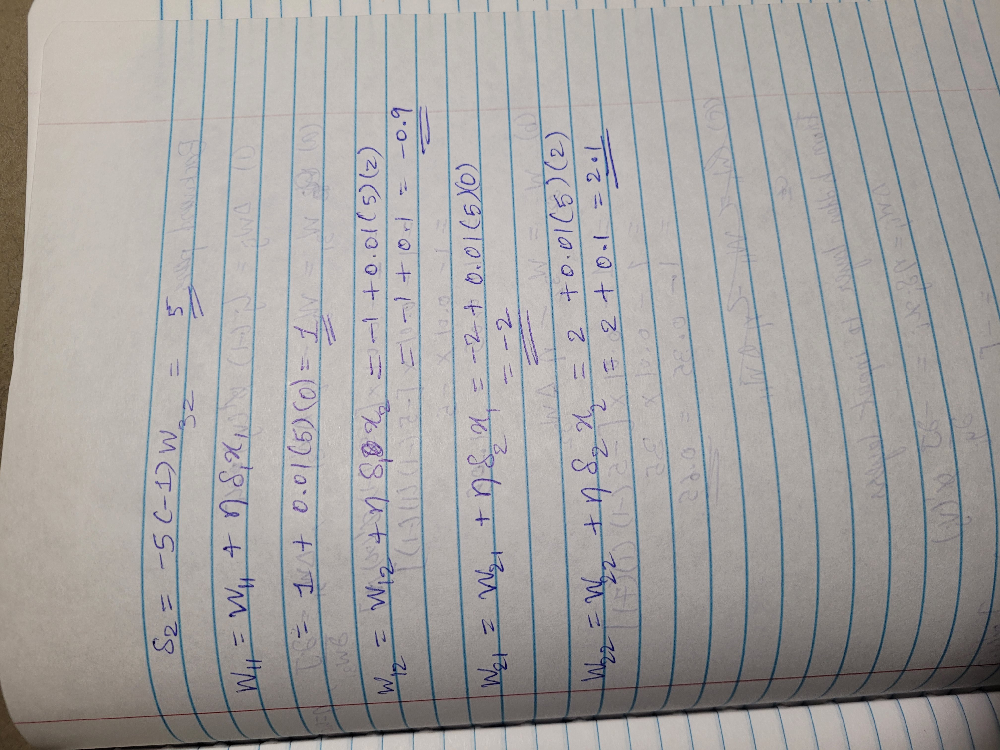

---
# Submit Your Solution

Confirm that you've successfully completed the assignment.

```add``` and ```commit``` the final version of your work, and ```push``` your code to your GitHub repository.

Submit the URL of your GitHub Repository as your assignment submission on Canvas.